In [1]:
import matplotlib.pyplot as plt
import mne
import glob
from natsort import natsorted
from pprint import pprint
import os
import numpy as np
import scipy
from scipy import signal
from scipy.fft import fft, fftfreq, fftshift

In [2]:
def butter_bandpass(lowcut, highcut, fs, order=4):
    # to gain butterworth bandpass filter paramater
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = signal.butter(order, [low, high], btype='band')
    return b, a

def apply_filter_to_signal(signal, lowcut, highcut, fs, order=4):
    # apply butterworth bandpass filter to the signal
    b, a = butter_bandpass(lowcut, highcut, fs, order)
    filtered = signal.filtfilt(b, a, signal)
    return signal

def fft_for_signal(signal, fs):
    # apply fft for signal
    shifted_ffted_signal = fftshift(fft(signal))
    shifted_freq = fftshift(fftfreq(signal.shape[-1], 1/fs))
    return shifted_ffted_signal, shifted_freq

def plot_signal_fft(signal, fs):
    # plot signal and freq spectrum in a figure
    ffted_signal, shifted_freq = fft_for_signal(signal, fs)
    
    plt.subplot(2,1,1)
    plt.plot(signal)
    plt.subplot(2,1,2) 
    plt.plot(shifted_freq[int(len(signal)//2):-1], 
        np.abs(ffted_signal[int(len(signal)//2):-1]))
    plt.xlim([0, 5])
    # plt.ylim([0, 40000])
    plt.autoscale(tight=True)
    plt.show()

def plot_fft(signal, fs):
    # plot freq spect that filter applied signal 
    N = len(signal)
    T = 1.0 / fs
    signal = signal * scipy.signal.blackman(N)
    ffted_signal, shifted_freq = fft_for_signal(signal, fs)
    plt.plot(shifted_freq, 1.0/N * np.abs(ffted_signal))
    plt.xlim(0, 2)
    plt.grid()
    plt.show()

In [3]:
os.getcwd()
datafile_path = '../data'
search_path = '../data/*/*'
path_list = natsorted(glob.glob(search_path))
pprint(path_list)

['../data/S01_ME/motorexecution_subject1_run1.gdf',
 '../data/S01_ME/motorexecution_subject1_run2.gdf',
 '../data/S01_ME/motorexecution_subject1_run3.gdf',
 '../data/S01_ME/motorexecution_subject1_run4.gdf',
 '../data/S01_ME/motorexecution_subject1_run5.gdf',
 '../data/S01_ME/motorexecution_subject1_run6.gdf',
 '../data/S01_ME/motorexecution_subject1_run7.gdf',
 '../data/S01_ME/motorexecution_subject1_run8.gdf',
 '../data/S01_ME/motorexecution_subject1_run9.gdf',
 '../data/S01_ME/motorexecution_subject1_run10.gdf',
 '../data/S01_MI/motorimagination_subject1_run1.gdf',
 '../data/S01_MI/motorimagination_subject1_run2.gdf',
 '../data/S01_MI/motorimagination_subject1_run3.gdf',
 '../data/S01_MI/motorimagination_subject1_run4.gdf',
 '../data/S01_MI/motorimagination_subject1_run5.gdf',
 '../data/S01_MI/motorimagination_subject1_run6.gdf',
 '../data/S01_MI/motorimagination_subject1_run7.gdf',
 '../data/S01_MI/motorimagination_subject1_run8.gdf',
 '../data/S01_MI/motorimagination_subject1_run9

In [10]:
raw = mne.io.read_raw_gdf(path_list[21], eog=['eog-l', 'eog-m', 'eog-r'])

Extracting EDF parameters from /home/biolab/upper-limb-movements-decoder-from-eeg/data/S02_ME/motorexecution_subject2_run2.gdf...
GDF file detected
Setting channel info structure...
Creating raw.info structure...
/home/biolab/upper-limb-movements-decoder-from-eeg/venv/lib/python3.6/site-packages/mne/io/edf/edf.py:1004: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
  etmode = np.fromstring(etmode, np.uint8).tolist()[0]


In [11]:
otherdict = {key: 'hbo' for key in raw.ch_names[64:]}
raw.set_channel_types(otherdict)

<RawGDF | motorexecution_subject2_run2.gdf, 96 x 165888 (324.0 s), ~186 kB, data not loaded>

In [6]:
tmp = raw.get_data(picks='eeg')

In [7]:
len(tmp[0])

165888

In [8]:
tmp[0][~np.isnan(tmp[0])].shape[0]

165425

In [12]:
raw.load_data()
t_max = tmp[0][~np.isnan(tmp[0])].shape[0]
raw_cropped = raw.crop(tmin=8/512, tmax=(t_max-1)/512) # .set_eeg_reference(ref_channels='average', ch_type='eeg')

Reading 0 ... 165887  =      0.000 ...   323.998 secs...


In [119]:
print(raw_avg_ref.info)

<Info | 8 non-empty values
 bads: []
 ch_names: F3, F1, Fz, F2, F4, FFC5h, FFC3h, FFC1h, FFC2h, FFC4h, FFC6h, ...
 chs: 61 EEG, 3 EOG, 32 HBO
 custom_ref_applied: True
 highpass: 0.0 Hz
 lowpass: 256.0 Hz
 meas_date: 2015-06-23 12:45:11 UTC
 nchan: 96
 projs: []
 sfreq: 512.0 Hz
>


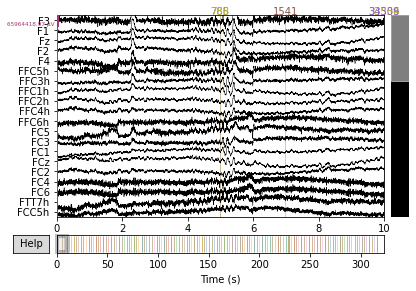

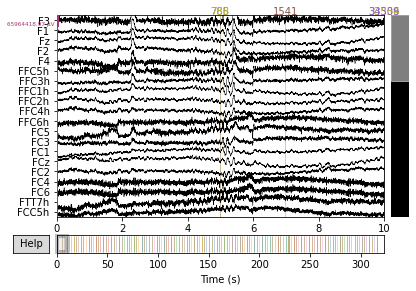

In [120]:
raw_avg_ref.pick(['eeg']).plot(scalings='auto')

Effective window size : 4.000 (s)


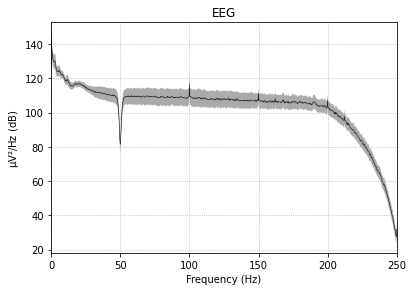

In [121]:
fig = raw_avg_ref.plot_psd(tmax=np.inf, fmax=250, average=True)
# add some arrows at 60 Hz and its harmonics:
for ax in fig.axes[:2]:
    freqs = ax.lines[-1].get_xdata()
    psds = ax.lines[-1].get_ydata()
    for freq in (60, 120, 180, 240):
        idx = np.searchsorted(freqs, freq)
        ax.arrow(x=freqs[idx], y=psds[idx] + 18, dx=0, dy=-12, color='red',
                 width=0.1, head_width=3, length_includes_head=True)

Effective window size : 4.000 (s)


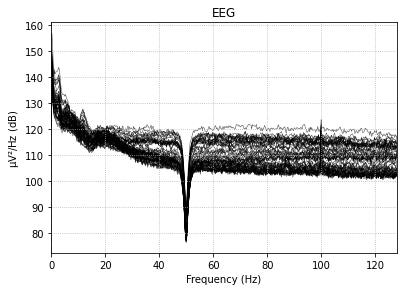

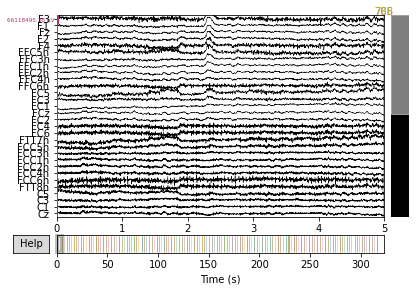

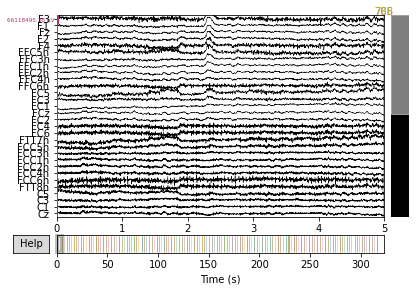

In [122]:
raw.plot_psd(fmax=128)
raw.plot(duration=5, n_channels=30, scalings='auto')

# Preprocessing
- remove noizy channels
- Downsampled the data to 256Hz
- mark artifacts 
    1. by band-pass filter(0.3-70Hz, 4th order zero-phase Butterworth filter)
    2. find values above/below thresholds of -200uV and 200uV from data
    3. 


## Downsample
Used scipy.signal.resample()

In [31]:
eeg_data = raw_cropped.get_data(picks='eeg')

In [33]:
eeg_data.shape

(61, 165417)

In [34]:
downsampled_list = []
for sig in eeg_data:
    downsampled_list.append(signal.resample(sig, eeg_data.shape[1]//512 * 128))
resampled_signal = np.array(downsampled_list)

In [35]:
resampled_signal.shape

(61, 41344)

In [124]:
raw_resampled = raw_avg_ref.resample(256)

In [125]:
raw_resampled.get_data(picks='eeg')[0]

array([211.57299759, 214.70553093, 210.34238759, ..., 211.88180446,
       216.97875226, 217.33524598])

## Butterworth Filter
band-pass filtering (0.3 Hz—70 Hz, 4th order zero-phase Butterworth filter)


In [130]:
raw_filtered = raw_resampled.filter(l_freq=0.3, h_freq=70, picks='eeg', method='iir')

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.3 - 70 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 16 (effective, after forward-backward)
- Cutoffs at 0.30, 70.00 Hz: -6.02, -6.02 dB



In [131]:
raw_filtered.get_data(picks='eeg')[0]

array([-0.17672572,  0.294054  ,  1.71142502, ..., -1.3553356 ,
       -2.92734334,  0.33407679])

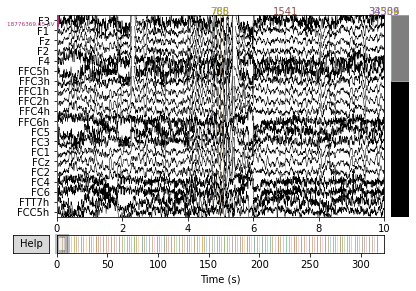

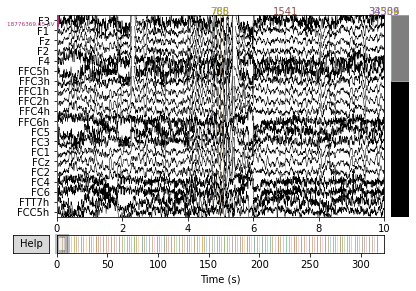

In [132]:
raw_filtered.pick(['eeg']).plot(scalings='auto')

Effective window size : 8.000 (s)


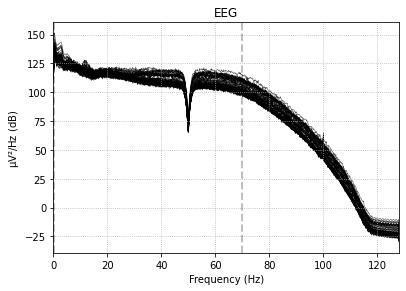

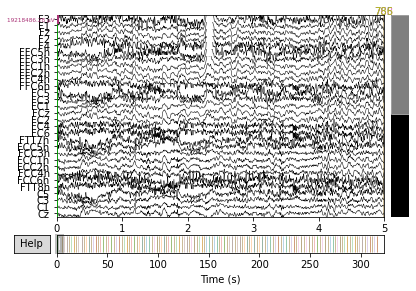

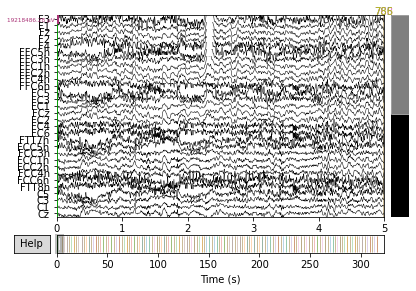

In [129]:
raw.plot_psd(fmax=128)
raw.plot(duration=5, n_channels=30, scalings='auto')

In [97]:
b, a = butter_bandpass(0.3, 70, 256, 4)

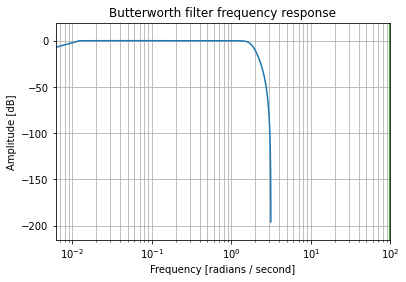

In [98]:
w, h = signal.freqz(b, a)
plt.semilogx(w, 20 * np.log10(abs(h)))
plt.title('Butterworth filter frequency response')
plt.xlabel('Frequency [radians / second]')
plt.ylabel('Amplitude [dB]')
plt.margins(0, 0.1)
plt.grid(which='both', axis='both')
plt.axvline(100, color='green') # cutoff frequency
plt.show()

In [99]:
print(tmp.shape)
tmmp = tmp[~np.isnan(tmp)]
print(tmp.shape)

(61, 165888)
(61, 165888)


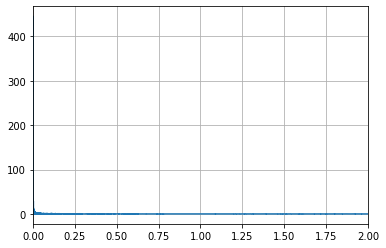

In [100]:
plot_fft(tmmp, 512)

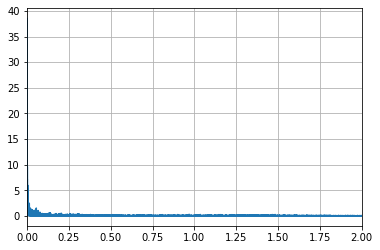

In [101]:
plot_fft(tmmp-np.mean(tmmp), 256)

In [102]:
tmmp.shape

(10090925,)

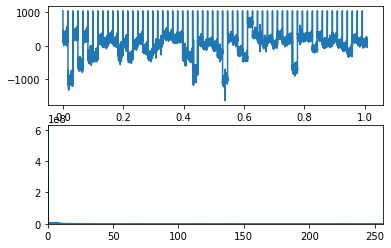

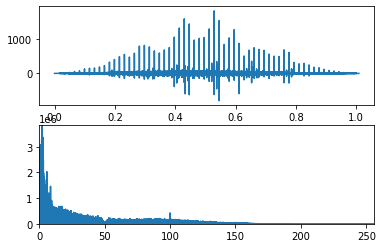

In [103]:
plot_signal_fft(tmmp-np.mean(tmmp), 512)
w_hann = signal.hann(len(tmmp))
filtered = signal.filtfilt(b, a, w_hann*tmmp-np.mean(tmmp))
plot_signal_fft(filtered, 512)

In [104]:
# plot_signal_fft(tmmp[8:-8]-np.mean(tmmp[8:-8]), 256)
# w_hann = signal.hann(len(tmmp[8:-8]))
# filtered = signal.filtfilt(b, a, w_hann*tmmp[8:-8]-np.mean(tmmp[8:-8]))
# plot_signal_fft(filtered, 256)

Next, 
Mark artifacts judged by threshold of +_ 200uV.
他の論文におけるアーティファクト対策を調べるあとから．
とりあえず飛ばして，フィルタ，re-referencing(common average reference)のあと分類！


In [105]:
b, a = butter_bandpass(0.3, 3, 256, 4)

# ToDo
信号処理はなるだけMNEに依存しない形で．
- Downsampling with scipy
- Filtering with scipy
